In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

from math import *
import time
from IPython import display

from PIL import Image
from scipy.special import sph_harm

DEVICE = "cuda"

In [2]:
# Linear interpolation
#
# u = x-floor(x)
# v = y-floor(y)
# u*v*psi[x+1,y+1] + (1-u)*v*psi[x,y+1] + u*(1-v)*psi[x+1,y] + (1-u)*(1-v)*psi[x,y]

class HashTable(nn.Module):
    def __init__(self, T = 2**21, scale0 = 16, scale1 = 2048, L = 16, d=2):
        super().__init__()
        self.L = L
        self.T = T
        self.scale0 = scale0
        self.scale1 = scale1
        self.d = d        
        self.primes = [1, 2654435761, 805459861]
        self.hashtable = nn.Parameter(torch.randn(T,2)*1e-4)
        
    def hash(self, x): # x is batch x dim
        z = torch.zeros(x.shape[0]).to(DEVICE).long()
        
        for d in range(self.d):
            zi = x[:,d].long() * int(self.primes[d])
            z = torch.bitwise_xor(z, zi)
        return self.hashtable[z%self.T]
    
    def forward(self, x): # x is batch x dim: [0..1]
        features = []
        for l in range(self.L):
            b = exp(log(self.scale0)*(1-(l/(self.L-1))) + log(self.scale1)*(l/(self.L-1)))
            
            coord = x*b
            
            coord_vals = []
            coord_w = []
            
            for cidx in range(2**self.d):
                w = 1
                icoord = coord.detach().clone()
                
                for d in range(self.d):
                    bit = (cidx // (2**d))%2
                    
                    if bit:
                        w *= (coord[:,d]-torch.floor(icoord[:,d]))
                        icoord[:,d] = torch.ceil(icoord[:,d])+1e-4
                    else:
                        w *= 1-(coord[:,d]-torch.floor(icoord[:,d]))
                        icoord[:,d] = torch.floor(icoord[:,d])
                
                icoord = icoord.long()
                coord_vals.append(self.hash(icoord).unsqueeze(2))
                coord_w.append(w.unsqueeze(1).unsqueeze(2))
            features.append(torch.sum(torch.cat(coord_w, 2) * torch.cat(coord_vals, 2), 2)) # batch x 2
        return torch.cat(features,1)
        
class CPPNNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.hashtable = HashTable()
        
        self.l1 = nn.Linear(32, 64)
        nn.init.orthogonal_(self.l1.weight, gain=1)
        self.l2 = nn.Linear(64, 64)
        nn.init.orthogonal_(self.l2.weight, gain=1)
        self.l3 = nn.Linear(64, 3)
        nn.init.orthogonal_(self.l3.weight, gain=1)
        
        self.optim = torch.optim.Adam(self.parameters(), betas=[0.9, 0.99], eps=1e-15, lr=1e-2)
        
    def forward(self, x):
        z = self.hashtable(x)
        
        z = F.elu(self.l1(z))
        z = F.elu(self.l2(z))
        z = torch.tanh(self.l3(z))
        
        return z
    
class DensityNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.l1 = nn.Linear(32, 64)
        self.l2 = nn.Linear(64, 16)
        
    def forward(self, x):
        z = torch.relu(self.l1(x))
        z = self.l2(z)
        
        density = torch.sigmoid(2*z[:,0]-2)
        
        return density, z

class RGBNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.l1 = nn.Linear(48, 64)
        self.l2 = nn.Linear(64, 64)
        self.l3 = nn.Linear(64, 3)
        
    def forward(self, x):
        z = torch.relu(self.l1(x))
        z = torch.relu(self.l2(z))
        z = torch.sigmoid(self.l3(z))
        
        return z
    
class NeRFNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.hashtable = HashTable(d=3)
        self.density = DensityNet()
        self.rgb = RGBNet()
        
        self.optim = torch.optim.Adam(self.parameters(), betas=[0.9, 0.99], eps=1e-15, lr=1e-2)

    def forward(self, x, harmonics):
        features = self.hashtable(x)
        
        rho, z = self.density(features)
        rgb = self.rgb(torch.cat([features, harmonics], 1))
        
        return rho, rgb

class Renderer():
    def __init__(self):
        pass
    
    def get_ray_batch(self, camera_position, forward, up, right, resolution):
        yy,xx = np.meshgrid(np.arange(resolution)/resolution-0.5, np.arange(resolution)/resolution-0.5)
        zz = torch.FloatTensor(np.concatenate([1.5*xx.ravel()[:,np.newaxis], 1.5*yy.ravel()[:,np.newaxis]], axis=1)).to(DEVICE)
        
        ray_dir = torch.nn.functional.normalize(forward.unsqueeze(0) + zz[:,1:2]*right.unsqueeze(0) - zz[:,0:1]*up.unsqueeze(0))
        
        ray_dir_np = ray_dir.cpu().detach().numpy()
        
        harmonics = []
        
        phi = np.arctan2(ray_dir_np[:,2], np.sqrt(ray_dir_np[:,0]**2 + ray_dir_np[:,1]**2))
        theta = np.arctan2(ray_dir_np[:,1], ray_dir_np[:,0])
        
        for n in range(0,4):
            for m in range(-n, n+1):
                harmonics.append(np.real(sph_harm(m, n, theta, phi)))
        
        harmonics = torch.FloatTensor(np.array(harmonics).transpose(1,0)).to(DEVICE)
        
        return camera_position.view(1,3).expand(ray_dir.shape[0], 3), ray_dir, harmonics

    def get_pixel_color(self, ray_pos, ray_dir, harmonics, net, stepsize=0.005, max_steps=120):
        weight_left = torch.ones(ray_pos.shape[0]).to(DEVICE)
        color = torch.zeros(ray_pos.shape[0],3).to(DEVICE)
        density_loss = 0
        
        for step in range(max_steps):
            pos = ray_pos + ray_dir * step * stepsize            
            within_bounds = torch.prod(torch.ge(pos,0).float()*torch.le(pos,1).float(),1)
            
            rho, rgb = net.forward(pos, harmonics)
            rho = rho * within_bounds * 0.5
            density_loss += torch.mean(torch.abs(rho))
            
            w = rho * weight_left
            weight_left = weight_left - w
            
            color = color + w.unsqueeze(1) * rgb
        
        return color, density_loss

## Image encoding

In [9]:
net = CPPNNet().to(DEVICE)

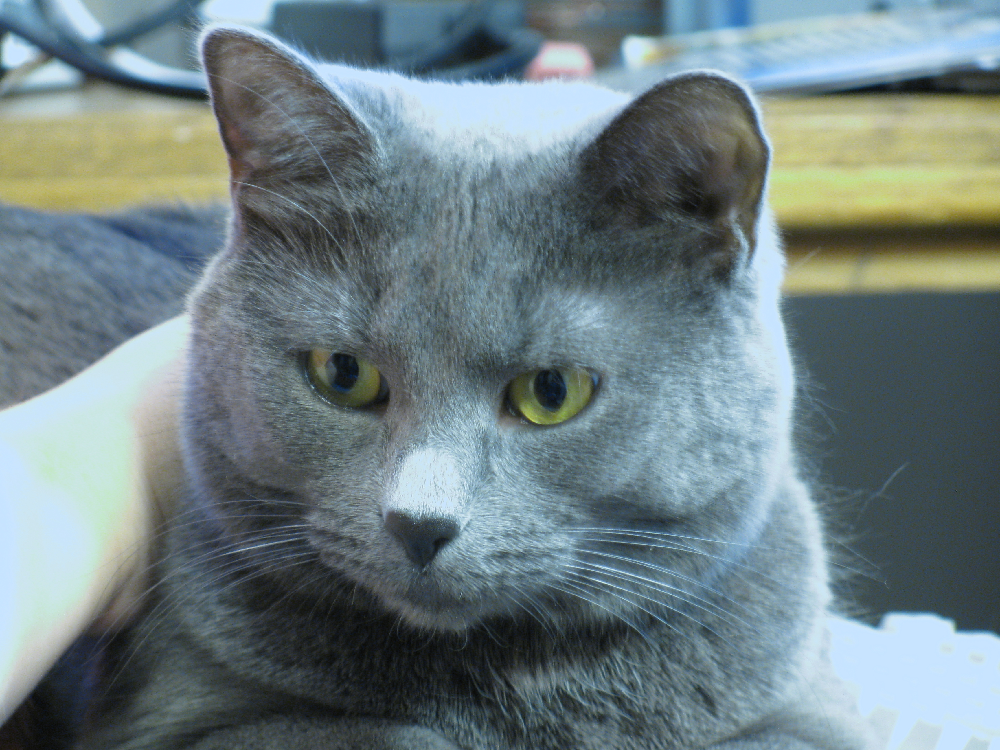

In [4]:
Image.open("IMG_0822.JPG")

In [5]:
im = torch.FloatTensor(np.array(Image.open("IMG_0822.JPG"))[::3,::3,:3]/128.0-1.0).to(DEVICE)

In [6]:
xx,yy = np.meshgrid(np.arange(im.shape[1])/im.shape[1], np.arange(im.shape[0])/im.shape[0])
zz = torch.FloatTensor(np.concatenate([xx.ravel()[:,np.newaxis], yy.ravel()[:,np.newaxis]], axis=1)).to(DEVICE)

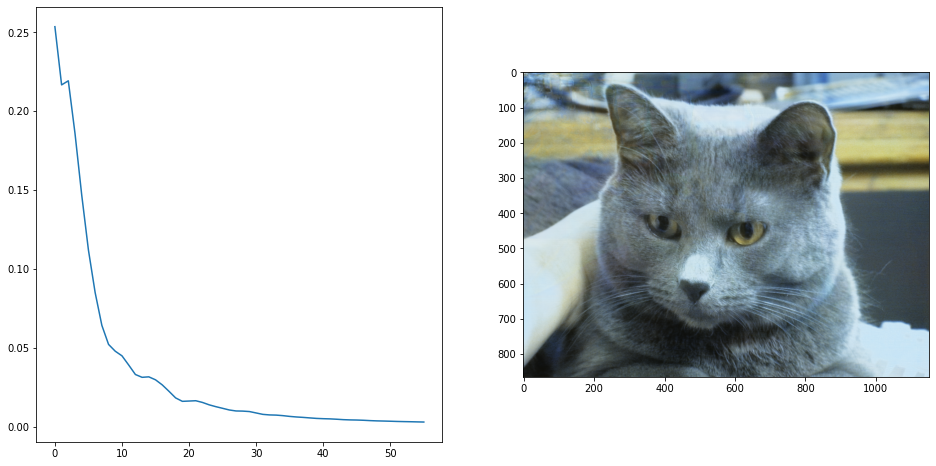

KeyboardInterrupt: 

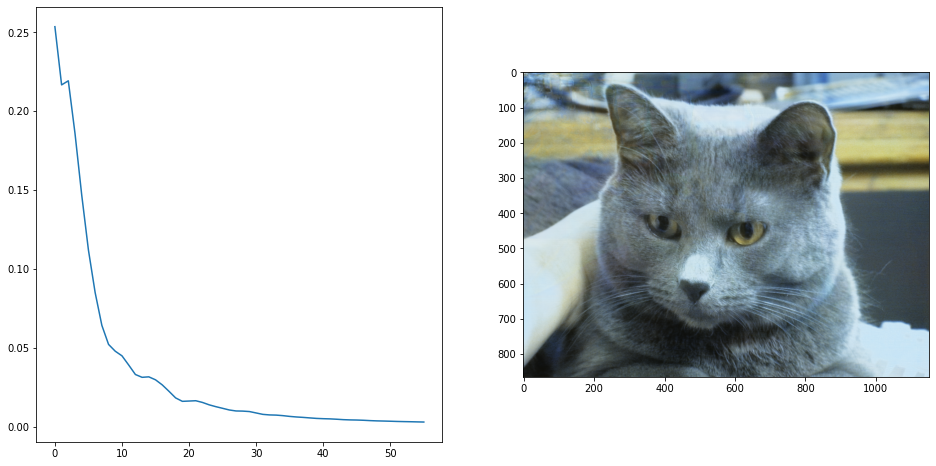

In [7]:
tr_err = []

#for p in net.optim.param_groups:
#    p['lr'] = 1e-3
    
for epoch in range(100000):
    net.optim.zero_grad()
    
    p = net.forward(zz)
    loss = torch.mean((p-im.view(im.shape[0]*im.shape[1], 3))**2)
    
    loss = loss + 1e-6 * torch.mean(net.l1.weight**2)
    loss = loss + 1e-6 * torch.mean(net.l2.weight**2)
    loss = loss + 1e-6 * torch.mean(net.l3.weight**2)
    
    loss.backward()
    net.optim.step()
    
    tr_err.append(loss.cpu().detach().item())
    
    plt.clf()
    plt.subplot(1,2,1)
    plt.plot(tr_err)
    
    plt.subplot(1,2,2)
    p = np.clip(0.5*p.cpu().detach().numpy().reshape((im.shape[0], im.shape[1], 3)) + 0.5,0,1)
    plt.imshow(p)
    
    plt.gcf().set_size_inches((16,8))
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(0.01)

In [15]:
p = net.forward(zz)


tensor([7.9137e-05, 7.6214e-05, 8.0912e-05, 8.4949e-05, 7.9900e-05, 8.5702e-05,
        8.0505e-05, 8.5148e-05, 8.0050e-05, 8.2397e-05, 8.1208e-05, 8.1418e-05,
        8.0545e-05, 8.1487e-05, 8.1632e-05, 8.2425e-05, 8.1151e-05, 8.1584e-05,
        8.1726e-05, 8.1957e-05, 8.1794e-05, 8.1867e-05, 8.2067e-05, 8.2108e-05,
        8.1892e-05, 8.2137e-05, 8.0982e-05, 8.0895e-05, 8.1839e-05, 8.2174e-05,
        8.2852e-05, 8.2966e-05], device='cuda:0', grad_fn=<StdBackward0>) tensor([ 4.6949e-07,  9.5344e-07,  8.6170e-07,  1.7189e-07,  1.5300e-07,
         1.5417e-06, -1.1995e-06,  2.0899e-06, -1.5809e-06,  1.6801e-06,
        -1.8853e-06,  3.5360e-07, -1.0958e-06,  1.3796e-07, -7.3504e-07,
         3.2206e-08, -3.1335e-08, -1.9038e-07, -1.0418e-07, -4.0737e-07,
        -1.8015e-07, -1.3276e-07, -1.2690e-07, -1.0653e-07, -3.1779e-08,
        -2.3554e-08, -1.7358e-08, -2.7303e-08, -1.3276e-07,  4.8862e-08,
         5.7649e-09,  8.7902e-08], device='cuda:0', grad_fn=<MeanBackward1>)


RuntimeError: CUDA out of memory. Tried to allocate 244.00 MiB (GPU 0; 7.77 GiB total capacity; 5.20 GiB already allocated; 150.75 MiB free; 5.53 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

## NeRF

In [3]:
nerf = NeRFNet().to(DEVICE)
nerf.load_state_dict(torch.load("nerf.pth"))
render = Renderer()

In [4]:
track = np.loadtxt("track.txt")

forward = track[:,3:6] - track[:,:3]
up = track[:,6:9] - track[:,:3]
right = track[:,9:12] - track[:,:3]

print(np.sum(forward**2,axis=1))

min_pos = np.min(track[:,:3],axis=0)
max_pos = np.max(track[:,:3],axis=0)

max_L = np.max(max_pos-min_pos)

track[:,:3] -= min_pos
track[:,:3] /= max_L

positions = 0.75 * (track[:,:3]-0.5) + 0.5

[1.00001092 1.00000502 1.00000779 1.00001054 1.00000186 0.99998634
 0.99999677 0.99999488 1.00000378 1.00001198 1.00001413 0.9999912
 1.0000031  0.99998951 1.00000654 0.99999285 0.99999056 0.99998924
 0.99999723 1.00001411 1.0000129  1.00000725 1.00000567 0.99999979
 0.99999515 0.99999363 0.99999889 1.00000726 0.99998329 1.00000608
 0.99999723 0.99999432 1.00000845 0.99998817 1.00001896 1.000085
 0.99992555 1.00002734 1.00011135 1.00000088 1.00012011 0.99994947
 1.00015045 1.00002037 1.00003661 0.99989304 1.00001609 1.00004863
 1.00001105 1.00006807 0.99996848 0.99992262 0.99998733 0.99999075
 1.00000405 0.99999459 1.00000382 0.99999452 1.00001201 0.99999291
 0.99999018 0.99999827 0.99998826 0.99999906 0.99999634 0.99999519
 0.999995   1.0000172  0.99999741 0.99999574 0.99998699 1.0000109
 0.99999701 1.00000948 1.00001246 0.99999215 1.00001439 1.00000818
 1.00000249 1.00000018 1.00000706 0.9999924  1.00000177 1.00000268
 0.99998641 1.00000286 1.00000585 1.00000289 0.9999962  0.99999758

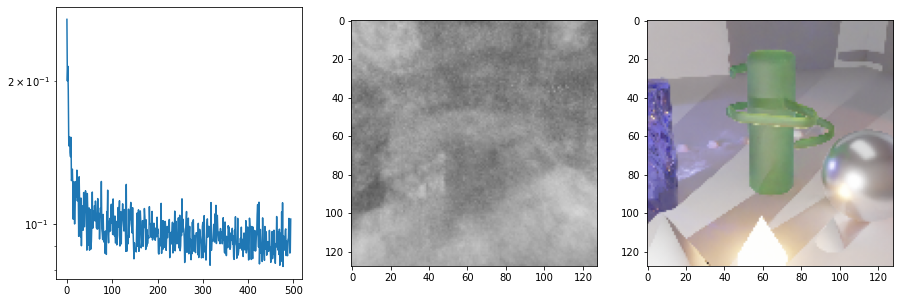

KeyboardInterrupt: 

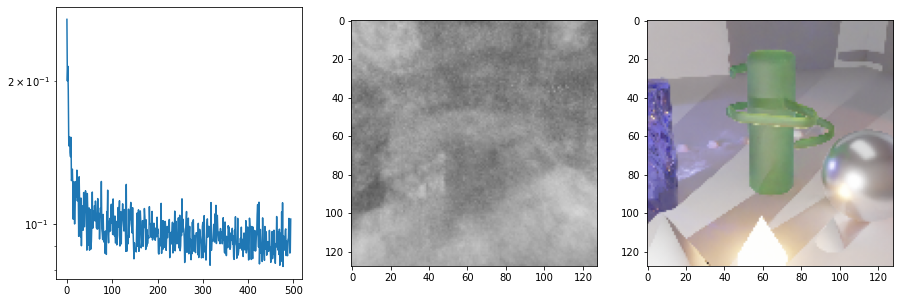

In [5]:
tr_err = []

for epoch in range(100000):
    nerf.optim.zero_grad()
    
    errs = []
    for b in range(1):
        frame = np.random.randint(150)
        im = np.array(Image.open("/sata/data/nerf/luxscene/images/%.4d.png" % (frame+1)))[::8,::8,:3]/256.0
        im = torch.FloatTensor(im).to(DEVICE)
        
        campos = torch.FloatTensor(positions[frame]).to(DEVICE)

        raypos, raydir, harmonics = render.get_ray_batch(campos, torch.FloatTensor(forward[frame]).to(DEVICE),
                                   torch.FloatTensor(up[frame]).to(DEVICE),
                                   torch.FloatTensor(right[frame]).to(DEVICE), im.shape[0])

        p, dloss = render.get_pixel_color(raypos, raydir, harmonics, nerf)
        loss = torch.mean((im.view(im.shape[0]*im.shape[1],3)-p)**2) + 1e-1 * dloss
        loss.backward()
        errs.append(loss.cpu().detach().item())
    
    nerf.optim.step()
    
    tr_err.append(np.mean(errs))
    
    plt.clf()
    plt.subplot(1,3,1)
    plt.plot(tr_err)
    plt.yscale("log")
    
    plt.subplot(1,3,2)
    p = np.clip(p.cpu().detach().numpy().reshape((im.shape[0], im.shape[1], 3)),0,1)
    plt.imshow(p)
    
    plt.subplot(1,3,3)
    im = np.clip(im.cpu().detach().numpy(),0,1)
    plt.imshow(im)
    
    plt.gcf().set_size_inches((15,5))
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(0.01)    

In [6]:
torch.save(nerf.state_dict(), open("nerf.pth","wb"))

In [7]:
# https://www.openvdb.org/documentation/doxygen/python.html

import pyopenvdb as vdb

cube = vdb.FloatGrid()
cube.name = 'cube'

accessor = cube.getAccessor()

with torch.no_grad():
    positions = []

    for z in range(96):
        for y in range(96):
            for x in range(96):
                vox = [x,y,z]

                pos = torch.cuda.FloatTensor(vox).unsqueeze(0)/96.0
                positions.append(pos)

    positions = torch.cat(positions,0)

    features = nerf.hashtable(positions)

    rho, z = nerf.density(features)
    
    rho = rho.cpu().detach().numpy()
    i = 0
    for z in range(96):
        for y in range(96):
            for x in range(96):
                vox = [x,y,z]
                
                accessor.setValueOn(vox, rho[i])
                i += 1
    
vdb.write('mygrids.vdb', grids=[cube])

In [21]:
rho.shape

(262144,)

In [14]:
np.mean((p-im.cpu().detach().numpy())**2)

0.02001882

In [ ]:
!mkdir output
!rm output/*.png

with torch.no_grad():
    for frame in range(150):
        campos = \
            (torch.FloatTensor(positions[frame]).to(DEVICE) + 
             torch.FloatTensor(positions[frame]).to(DEVICE))/2.0
        campos[2] += 0.01*cos(2*pi*frame/30)

        raypos, raydir, harmonics = render.get_ray_batch(campos, torch.FloatTensor(forward[frame]).to(DEVICE),
                                   torch.FloatTensor(up[frame]).to(DEVICE),
                                   torch.FloatTensor(right[frame]).to(DEVICE), 128)

        p, _ = render.get_pixel_color(raypos, raydir, harmonics, nerf, stepsize=0.01)
        p = np.clip(255*p.cpu().detach().numpy().reshape((128, 128, 3)),0,255).astype(np.uint8)
        plt.clf()
        plt.imshow(p)
        display.clear_output(wait=True)
        display.display(plt.gcf())
        time.sleep(0.01)    

        im = Image.fromarray(p)
        im.save("output/%.6d.png" % frame)


mkdir: cannot create directory ‘output’: File exists


In [38]:
campos

tensor([0.0418, 0.2077, 0.0033], device='cuda:0')

In [24]:
up[frame]

array([0.23158, 0.15143, 0.96095])